# DTSA-5511 Week 5 Kaggle Mini Project - GANs

**Genesis Zhong**

https://github.com/genesischung/5511-GANs

## Introduction

This project is a Kaggle competition https://www.kaggle.com/competitions/gan-getting-started which aims at using GANs to generate Monet-esque images.

GANs, or Generative Adversarial Networks, is a type of deep learning neural network architecture with two main components: a generator model and a discriminator model. The generator is used to generate images, and the discriminator is used for identifying real vs. generated images. By training the generator against the discriminator, we can get better-quality images.

This project is based on Amy Jang's starter tutorial notebook (https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook) for using TPU, loading data, and implementing CycleGAN. According to a thread on the slack channel for this course, this is acceptable as long as I implement my own generator and discriminator. So I implemented my own generator and discriminator based on the 2017 Paper `Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks` by Zhu et al. 

## Setup

Since Kaggle has a weekly limit of 20 hours of TPU time, and there is usually a long queue to use the TPU, I first prototype the project on my local GPU before running on Kaggle. Only after successfully training the model for 1 epoch, I would hand the notebook off to Kaggle notebook.

In [1]:
#!conda activate tf
#!nvidia-smi

In [2]:
# Import packages
from kaggle_datasets import KaggleDatasets

import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, LeakyReLU, Activation, Add
from tensorflow.keras.layers import BatchNormalization, GroupNormalization

import matplotlib.pyplot as plt

import numpy as np
import pandas as pd

import PIL

D0814 21:37:01.099891084      14 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0814 21:37:01.099915904      14 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0814 21:37:01.099919533      14 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0814 21:37:01.099922347      14 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0814 21:37:01.099925397      14 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0814 21:37:01.099928032      14 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0814 21:37:01.099930717      14 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0814 21:37:01.

In [3]:
try:
    # try using TPU
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
except:
    # use default GPU on local system
    strategy = tf.distribute.get_strategy()

print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

Device: 
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:T

## Data Description

The dataset for this project is distributed through four folders: monet_tfrec, monet_jpg, photo_tfrec, and photo_jpg. 

The _tfrec and _jpg folders actually contain the same images in two different formats. _tfrec folders contain files in TFRecord format, and _jpg folders contain the images in .jpg format.

We will be using the TFRecord format since it's faster to load them into our jupyter notebook, and it is a format we can work with (since we are using tensorflow for this project).

monet_tfrec folder contains 300 Monet paintings sized 256x256x3 in TFRecord format.

photo_tfrec folder contains 7028 photos sized 256x256x3 in TFRecord format.


In [4]:
# Load files on kaggle
GCS_PATH = KaggleDatasets().get_gcs_path()

MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/*.tfrec'))


"""
# load files on local PC
MONET_FILENAMES = tf.io.gfile.glob(str('monet_tfrec/*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str('photo_tfrec/*.tfrec'))
"""

print('Number of Monet TFRecord Files:', len(MONET_FILENAMES))
print('Number of Photo TFRecord Files:', len(PHOTO_FILENAMES))

Number of Monet TFRecord Files: 5
Number of Photo TFRecord Files: 20


get_gcs_path is not required on TPU VMs which can directly use Kaggle datasets, using path: /kaggle/input/gan-getting-started


In [5]:
IMAGE_SIZE = [256, 256]
BATCH_SIZE = 1

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)

    image = (tf.cast(image, tf.float32) / 127.5) - 1

    # Reshape the tensor to the specified size
    image = tf.reshape(image, [*IMAGE_SIZE, 3])

    return image

def read_tfrecord(example):

    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }

    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])

    return image


In [6]:
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)

    return dataset

In [7]:
# load the images into data set
monet_ds = load_dataset(MONET_FILENAMES, labeled=True).batch(BATCH_SIZE)
photo_ds = load_dataset(PHOTO_FILENAMES, labeled=True).batch(BATCH_SIZE)

## EDA

First let's take a look at some of these real photos and the Monet paintings.

Below I plotted 10 real photos and 10 Monet paintings. Just looking at these images, I can certainly tell the difference between a photo and a Monet painting. But I can't describe the difference in verbal terms. I just know there is a difference.

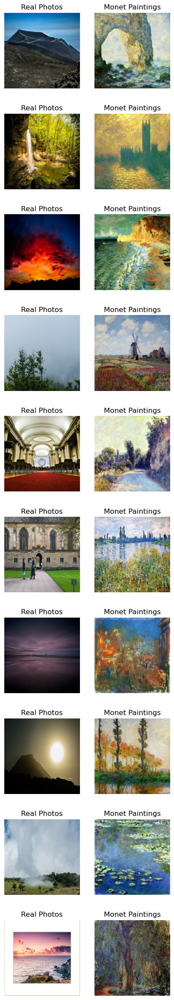

In [56]:
num_samples = 10

_, ax = plt.subplots(num_samples, 2, figsize=(num_samples//2, num_samples*3))
photo = np.array(list(photo_ds.take(num_samples).as_numpy_iterator())).squeeze()
monet = np.array(list(monet_ds.take(num_samples).as_numpy_iterator())).squeeze()

for i in range(num_samples):
    ax[i, 0].set_title('Real Photos')
    ax[i, 0].imshow((photo[i] * 127.5 + 127.5).astype(np.uint8))
    ax[i, 0].axis('off')

    ax[i, 1].set_title('Monet Paintings')    
    ax[i, 1].imshow((monet[i] * 127.5 + 127.5).astype(np.uint8))
    ax[i, 1].axis('off')
plt.show()

To better visualize the difference, I plot another 3 sets of photos and Monet paintings with RGB channels.

At the first glance, real photos seem to have balanced RGB channels. In Monet paintings, the Green channel seems stronger, and the Blue channel appears less obvious. This could very well be a difference in the color space between real images and Monet paintings.

In [57]:
from mpl_toolkits.axes_grid1.axes_rgb import RGBAxes

def plot_RGB(photo):
    photo = (photo * 127.5 + 127.5).astype(np.uint8)
    fig = plt.figure()
    ax = RGBAxes(fig, [0.1, 0.1, 0.8, 0.8], pad=0.0)
    r, g, b = photo[ :, :, 0], photo[ :, :, 1], photo[ :, :, 2]
    ax.imshow_rgb(r, g, b)


In [62]:
sample_photo = np.array(list(photo_ds.take(13).as_numpy_iterator())).squeeze()
sample_monet = np.array(list(monet_ds.take(13).as_numpy_iterator())).squeeze()


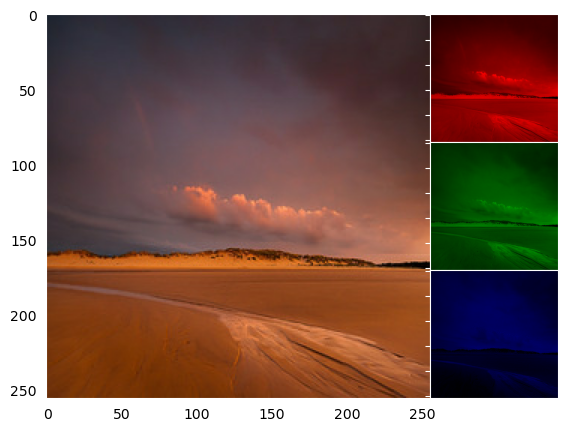

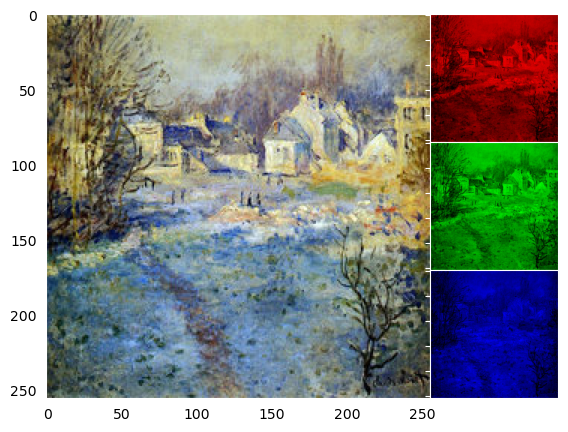

In [63]:
plot_RGB(sample_photo[10])
plot_RGB(sample_monet[10])

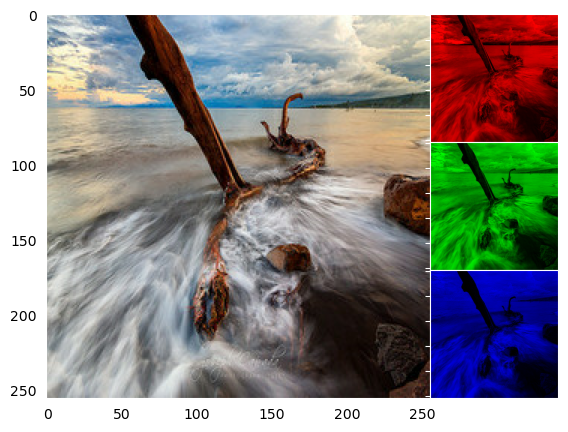

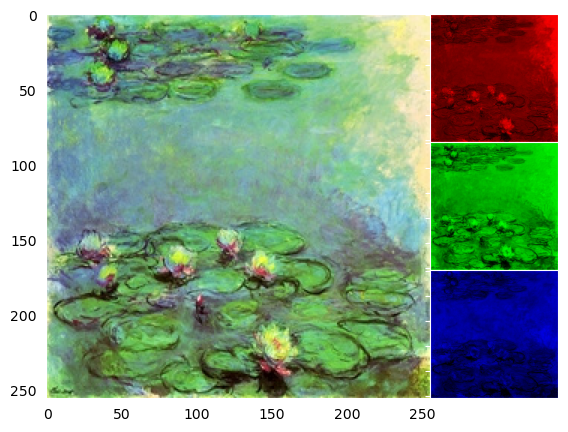

In [64]:
plot_RGB(sample_photo[11])
plot_RGB(sample_monet[11])

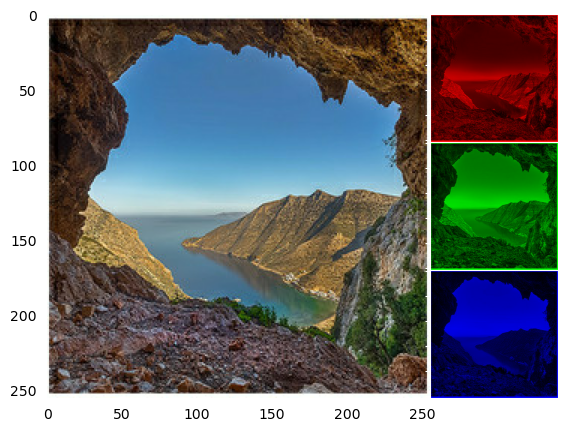

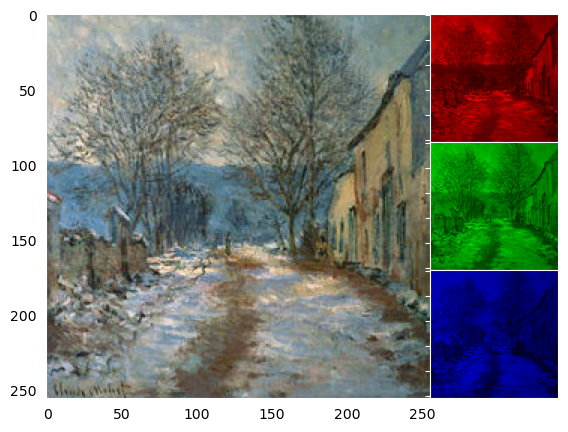

In [65]:
plot_RGB(sample_photo[12])
plot_RGB(sample_monet[12])

## Generator 

The generator architecture is specified in the paper as below: 

> Let `c7s1-k` denote a 7×7 Convolution-InstanceNormReLU layer with k filters and stride 1.
>
> `dk` denotes a 3×3 Convolution-InstanceNorm-ReLU layer with k filters and stride 2. Reflection padding was used to reduce artifacts.
>
> `Rk` denotes a residual block that contains two 3 × 3 convolutional layers with the same number of filters on both layer.
>
> `uk` denotes a 3 × 3 fractional-strided-ConvolutionInstanceNorm-ReLU layer with k filters and stride 1/2.
> 
> We use [...] 9 residual blocks for 256 x 256 or higher-resolution training images.
>
> The network with 9 residual blocks consists of:  `c7s1-64`, `d128`, `d256`, `R256`, `R256`, `R256`, `R256`, `R256`, `R256`, `R256`, `R256`, `R256`, `u128`, `u64`, `c7s1-3`
> 
>(Zhu et al., 2017, p.18)

For Instance Normalization, tensorflow does not provide a native InstanceNormalization layer. However, we can use the GroupNormalization layer with number of groups set to the input dimension. In that case, it will be identical to Instance Normalization.

For residual block, we use the Add() layer for skipping connections.

For the fractional-strided Convolutional layer, we use Conv2DTranspose layer, which is also known as Deconvolution layer.

In [8]:
# helper function for residual block
def residual_block(n_filters, inp):
    # initialize random weights and gamma parameter
    init = RandomNormal(mean=0.0, stddev=0.02)
    gamma_init = RandomNormal(mean=0.0, stddev=0.02) 

    # first 3x3 convolutional layer
    conv1 = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(inp)
    conv1 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(conv1)
    conv1 = Activation('relu')(conv1)
    
    # second 3x3 convolutional layer
    conv2 = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(conv1)
    conv2 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(conv2)
    
    # skip connections
    last = Add()([conv2, inp])
    return last
    
def Generator():
    # initialize random weights and gamma parameter
    init = RandomNormal(mean=0.0, stddev=0.02)
    gamma_init = RandomNormal(mean=0.0, stddev=0.02)
    
    # image input
    inp = Input(shape=(256,256,3))
    
    # c7s1-64
    c7s164 = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(inp)
    c7s164 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(c7s164)
    c7s164 = Activation('relu')(c7s164)
    
    # d128
    d128 = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(c7s164)
    d128 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(d128)
    d128 = Activation('relu')(d128)
    
    # d256
    d256 = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(d128)
    d256 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(d256)
    d256 = Activation('relu')(d256)
    
    # 9x R256
    r256 = d256
    for _ in range(9):
        r256 = residual_block(256, r256)
        
    # u128
    u128 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(r256)
    u128 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(u128)
    u128 = Activation('relu')(u128)
    
    # u64
    u64 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(u128)
    u64 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(u64)
    u64 = Activation('relu')(u64)
    
    # c7s1-3
    c7s13 = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(u64)
    c7s13 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(c7s13)
    last = Activation('tanh')(c7s13)
    
    # define model
    generator = Model(inp, last)

    return generator

## Discriminator

The discriminator architecture is also specified in the paper:

> For the discriminator networks we use 70 × 70 PatchGANs, which aim to classify whether 70 × 70 overlapping image patches are real or fake.
> 
> Let `Ck` denote a 4×4 Convolution-InstanceNorm-LeakyReLU layer with k filters and stride 2. After the last layer, we apply a convolution to produce a 1-dimensional output. We do not use InstanceNorm for the first C64 layer. We use leaky ReLUs with a slope of 0.2.
>
> The discriminator architecture is : `C64`-`C128`-`C256`-`C512`
>
> (Zhu et al., 2017, p.18)




In [9]:
def Discriminator():
    # initialize random weights and gamma parameter
    init = RandomNormal(stddev=0.02)
    gamma_init = RandomNormal(mean=0.0, stddev=0.02) 

    # image input
    inp = Input(shape=(256,256,3))

    # C64
    c64 = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(inp)
    c64 = LeakyReLU(0.2)(c64)

    # C128
    c128 = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(c64)
    c128 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(c128)
    c128 = LeakyReLU(0.2)(c128)

    # C256
    c256 = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(c128)
    c256 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(c256)
    c256 = LeakyReLU(0.2)(c256)

    # C512
    c512 = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(c256)
    c512 = GroupNormalization(groups=-1, axis=-1, gamma_initializer=gamma_init)(c512)
    c512 = LeakyReLU(0.2)(c512)

    # last layer for 1D output
    last = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(c512)

    # define model
    model = Model(inp, last)

    return model
    

In [10]:
with strategy.scope():
    # define the generators
    monet_generator = Generator() 
    photo_generator = Generator()
    
    # define the discriminator
    monet_discriminator = Discriminator() 
    photo_discriminator = Discriminator() 

/usr/local/lib/python3.8/site-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


## Model Structure

The generator structure is outlined below:

In [11]:
tf.keras.utils.plot_model(monet_generator, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [12]:
monet_generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  9472        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 group_normalization (GroupNorm  (None, 256, 256, 64  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

The discriminator structure is outlined below:

In [13]:
tf.keras.utils.plot_model(monet_discriminator, show_shapes=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [14]:
monet_discriminator.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_44 (Conv2D)          (None, 128, 128, 64)      3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_45 (Conv2D)          (None, 64, 64, 128)       131200    
                                                                 
 group_normalization_48 (Gro  (None, 64, 64, 128)      256       
 upNormalization)                                                
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 128)       0         
                                                           

## CycleGAN Model


This `CycleGan` class is provided in Amy Jang's tutorial. It contains two generators and two discriminators, one each for Monet images and one each for real photos. 

The `monet_generator` generates Monet-esque images from real photos, and the `photo-generator` does the reverse. Meanwhile, the `monet_discriminator` tries to identify the real Monet paintings from the ones generated from `monet_generator`. The `photo_discriminator` tries to identify the real photos from the ones generated from `photo_generator`.  So in essence, the generators generate images used for training the discriminators. In returns, the discriminators provide feedback to the generators to generate better-quality images.

In [15]:
class CycleGan(tf.keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # Photo to Monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # Monet to photo back to Monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generate itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # check discriminator, with real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # check  discriminator, with fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # compute generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # compute total cycle  loss
            total_cycle_loss = self.cycle_loss_fn(
                real_monet, cycled_monet, self.lambda_cycle) + \
                    self.cycle_loss_fn(
                        real_photo, cycled_photo, self.lambda_cycle)

            # compute total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + \
                self.identity_loss_fn(
                    real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + \
                self.identity_loss_fn(
                    real_photo, same_photo, self.lambda_cycle)

            # compute discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, 
                                                disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, 
                                                disc_fake_photo)

        # compute gradients 
        monet_generator_gradients = tape.gradient(
            total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(
            total_photo_gen_loss, self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(
            monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(
            photo_disc_loss, self.p_disc.trainable_variables)

        # Apply gradients to optimizers
        self.m_gen_optimizer.apply_gradients(
            zip(monet_generator_gradients, 
                self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(
            zip(photo_generator_gradients, 
                self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(
            zip(monet_discriminator_gradients, 
                self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(
            zip(photo_discriminator_gradients, 
                self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        } 
            


### Loss Function

We here define a series of loss functions used for the CycleGan class.

`discriminator_loss` function is used for measuring how well the discriminator is at telling the real images and the fake images apart. In modeling training, we will try to minimize the discriminator loss, in which case the generator is very good at generating fake images that are difficult to differentiate.

`generator_loss` function is used to measure how close the generated image is from an idealized real image by the discriminator. By minimizing the generator loss, the generator will be better at fooling the discriminator.

`cycle_loss` function measures how close the cycled image is from the input image. This is to ensure we preserve as much information on the input image as possible through the cycle.

`identity_loss` function measures how close the input image from the generated image. This is also to ensure we preserve as much information on the input image as possible with the generator.

In [16]:
with strategy.scope():

    def discriminator_loss(real, generated):

        # compute loss for real images
        real_loss = tf.keras.losses.BinaryCrossentropy(
            from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(
                tf.ones_like(real), real)

        # compute loss for fake images
        generated_loss = tf.keras.losses.BinaryCrossentropy(
            from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(
                tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss
        # get the average losses
        return total_disc_loss * 0.5

In [17]:
with strategy.scope():
            
    def generator_loss(generated):
        # Compute binarycrossentropy loss
        return tf.keras.losses.BinaryCrossentropy(
            from_logits=True, 
            reduction=tf.keras.losses.Reduction.NONE)(
                tf.ones_like(generated), generated)            

In [17]:
with strategy.scope():
            
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(
            from_logits=True, 
            reduction=tf.keras.losses.Reduction.NONE)(
                tf.ones_like(generated), generated)            

In [18]:
with strategy.scope():
    
    def cycle_loss(real_image, cycled_image, lambda_cycle):

        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return lambda_cycle * loss1

In [19]:
with strategy.scope():

    def identity_loss(real_image, same_image, lambda_cycle):

        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        
        return lambda_cycle * 0.5 * loss


### Training the CycleGAN model


We use Adam as our optimizer here. We also apply a weight decay, which would help further preventing overfitting. As we don't have a validation set to monitor, avoiding overfitting would be crucial for model performance.

In [20]:
with strategy.scope():

    # Set optimizer as Adam with weight decay
    monet_generator_optimizer = Adam(
        2e-4, beta_1=0.5, weight_decay=1e-4)
    photo_generator_optimizer = Adam(
        2e-4, beta_1=0.5, weight_decay=1e-4)
    monet_discriminator_optimizer = Adam(
        2e-4, beta_1=0.5, weight_decay=1e-4)
    photo_discriminator_optimizer = Adam(
        2e-4, beta_1=0.5, weight_decay=1e-4)


In [21]:
with strategy.scope():

    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, 
        monet_discriminator, photo_discriminator, 
        lambda_cycle=10
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = cycle_loss,
        identity_loss_fn = identity_loss,
    )    

In [22]:
# Train model
model_history = cycle_gan_model.fit(
    x=tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25,
    batch_size=128,
    verbose=1
)

Epoch 1/30


2023-08-14 21:39:14.433556: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-08-14 21:39:17.210425: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 368s 342ms/step - monet_gen_loss: 12.1720 - photo_gen_loss: 12.5494 - monet_disc_loss: 0.2450 - photo_disc_loss: 0.2510
Epoch 2/30
300/300 [==============================] - 102s 339ms/step - monet_gen_loss: 11.1986 - photo_gen_loss: 13.3074 - monet_disc_loss: 0.5376 - photo_disc_loss: 0.0799
Epoch 3/30
300/300 [==============================] - 101s 338ms/step - monet_gen_loss: 11.1899 - photo_gen_loss: 13.2488 - monet_disc_loss: 0.3185 - photo_disc_loss: 0.0683
Epoch 4/30
300/300 [==============================] - 101s 337ms/step - monet_gen_loss: 11.3177 - photo_gen_loss: 12.1019 - monet_disc_loss: 0.2366 - photo_disc_loss: 0.1734
Epoch 5/30
300/300 [==============================] - 101s 338ms/step - monet_gen_loss: 10.6892 - photo_gen_loss: 11.6562 - monet_disc_loss: 0.2776 - photo_disc_loss: 0.1527
Epoch 6/30
300/300 [==============================] - 102s 338ms/step - monet_gen_loss: 10.2376 - photo_gen_loss: 10.9035 - monet_disc_loss: 

## Results and Analysis

The competition used MiFID to evaluate the model performance, which isn't particularly easy to interpret. 

So here below, I generated 10 Monet-esque images based on real photos for visualization. 

From the first glance, the model did capture the essence of Monet paintings, as all the generated images give off the oil painting vibe. However, if we take a closer inspection of the generated images, we can easily tell that most images are fake.

Apparently the generator doesn't do a good job at processing dark color. For example, we can see some strange, dark spots on the first two generated paintings. We also see this kind of pattern in painting 4 through 8.

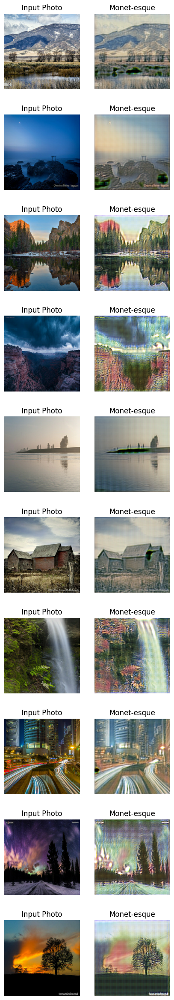

In [23]:
num_samples = 10

_, ax = plt.subplots(num_samples, 2, figsize=(num_samples/2, num_samples*3))
for i, img in enumerate(photo_ds.take(num_samples)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-esque")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

Anyhow, I think with more hyperparameter tuning, the generator will be able to generate more convincing images. This project is more of a proof of concept, demonstrating the power of such CycleGAN model.

### Submission


In [24]:
! mkdir ../images

i = 1
for img in photo_ds:
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(prediction)
    im.save("../images/" + str(i) + ".jpg")
    i += 1


In [25]:
import shutil

shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'

This particular model receives a score of `95.20286` on Kaggle.

### Further Modeling

Since there is a weekly limit on TPU time on kaggle, I did not get to do much hyperparameter tuning. But I did get to experiment the effect with different number of epoch. I generated images using the same 10 input photos for each version of models, and the results are down below:

#### Epoch = 45, score = 105.22178

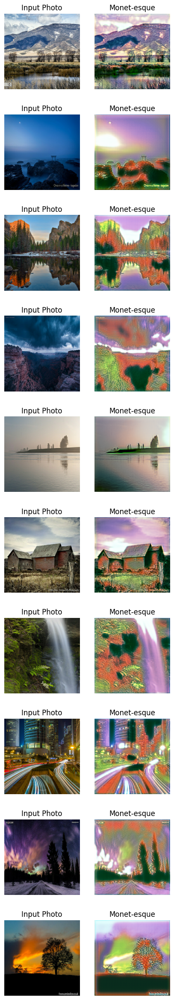

I expected the model to generate more realistic paintings with more epochs, but it turned out not to be the same. The epoch=45 model generated color-distorted images that seem to shift the color space too much to the purple-ish color.

#### Epoch = 25, score = 88.6258 (best)

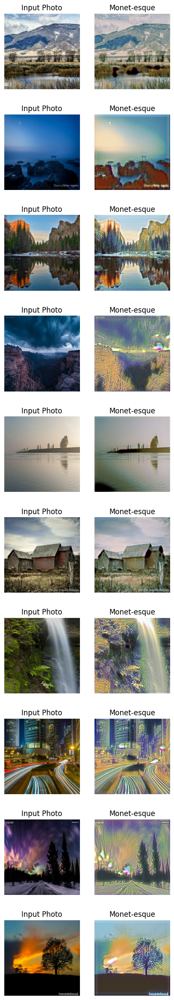

The epoch=25 model looks pretty good, and the score on kaggle definitely reflected on that. Similar to the epoch=30 model, all the generated images look like oil paintings. But the dark pattern issue on the epoch=30 model was not present here.

#### Epoch = 20, score = 90.42717

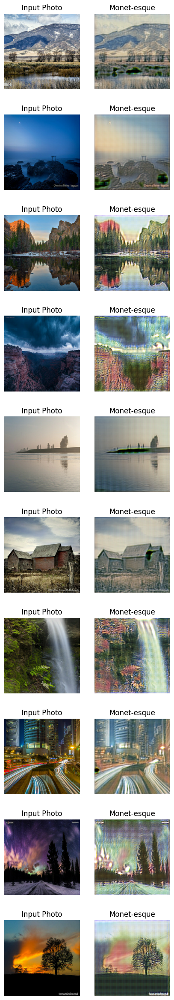

With epoch down to 20, we can observe the same dark color pattern. This is a bit unexpected because this issue was not present in the epoch=25 model. But overall, the issue looks less severe here, which is reflected in the lower score.

#### Epoch = 15, score=95.35185

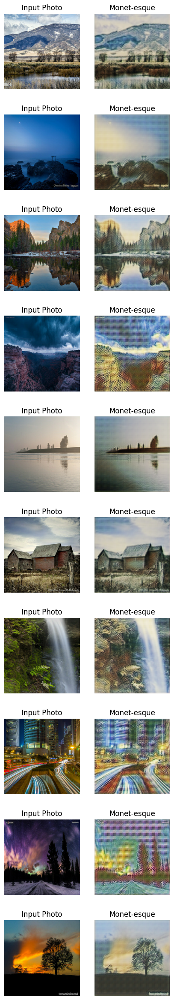

Personally, I think images generated by the epoch=15 model look the best, out of all the model I tried. There doesn't seem to be any imperfection, and the generated images are really close resemblance of oil paintings. Unfortunately, the MiFID score doesn't seem to agree. This is a problem with evaluating GANs models.

## Conclusion


In this project, we implemented a CycleGAN model outlined in the `Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks` paper.

This is by far the most difficult project in this course. Getting started on this project takes a lot of effort and troubleshooting, particularly because this competition needs to run in a kaggle notebook. I first started from scratch, and had trouble getting anything to work. We have a weekly limit of 20 hours of TPU time on kaggle, and a long wait queue to even start running the notebook. This just makes everything a lot more challenging. 

Eventually, I followed the advice and started working based on the Amy Jang starter notebook. But still waiting for TPU session was extremely time consuming. So I chose to do the work on my local environment before uploading the jupyter notebook to kaggle. This is not very easy because I implemented my own generator and discriminator. I trained the model for 1 epoch on my PC before running the code on kaggle, which usually takes a few hours but still better than waiting in queue on kaggle.

Nonetheless, how difficult it is to train a GAN model means I didn't get to do much hyperparameter tuning before running out of TPU time. From the limited trials I ran, I discovered that training CycleGAN can be a little unstable. The epoch=45 model has by far the worst performance. And between the epoch=25 and epoch=20 models, it shows that it sometimes takes a bit of luck to get a good model. So we definitely need to closely monitor the training on CyclaGAN models.

## References

- Zhu, J., Park, T., Isola, P., &amp; Efros, A. (2017). Unpaired image-to-image translation using cycle-consistent adversarial networks. 2017 IEEE International Conference on Computer Vision (ICCV). https://doi.org/10.1109/iccv.2017.244 https://doi.org/10.1109/iccv.2017.244 
- Zhou, Z. (2018). Discriminator networks of CycleGANs. Cycle GANS. https://cyclegans.github.io/project1/2018/04/21/Discriminator-Networks-of-CycleGANs/
- Jang, A. (2019). Monet CycleGAN Tutorial. Kaggle. https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook